### Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia.

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error,accuracy_score,confusion_matrix,classification_report,plot_roc_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [55]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


### A predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

In [17]:
df1=df.copy()
df1.shape

(8425, 23)

In [18]:
df1['Date']=pd.to_datetime(df1['Date'])
df1['Day']=df1['Date'].dt.day
df1['month']=df1['Date'].dt.month
df1['year']=df1['Date'].dt.year

In [19]:
df1.drop('Date',axis=1,inplace=True)

In [20]:
df1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,month,year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,24,6,2017


In [21]:
df1.isna().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Day                 0
month               0
year                0
dtype: int64

#### Evaporation and Sunshine have approx 50 percent null values , we should delete those features as they can led to wrong prediction.

In [22]:
df1.drop(columns=['Evaporation','Sunshine'],axis=1,inplace=True)

In [24]:
df1.info()#checking dtype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8350 non-null   float64
 2   MaxTemp        8365 non-null   float64
 3   Rainfall       8185 non-null   float64
 4   WindGustDir    7434 non-null   object 
 5   WindGustSpeed  7434 non-null   float64
 6   WindDir9am     7596 non-null   object 
 7   WindDir3pm     8117 non-null   object 
 8   WindSpeed9am   8349 non-null   float64
 9   WindSpeed3pm   8318 non-null   float64
 10  Humidity9am    8366 non-null   float64
 11  Humidity3pm    8323 non-null   float64
 12  Pressure9am    7116 non-null   float64
 13  Pressure3pm    7113 non-null   float64
 14  Cloud9am       6004 non-null   float64
 15  Cloud3pm       5970 non-null   float64
 16  Temp9am        8369 non-null   float64
 17  Temp3pm        8329 non-null   float64
 18  RainToda

In [27]:
#treating null values
df1['MinTemp'] = df1['MinTemp'].fillna(df1['MinTemp'].mean())
df1['MaxTemp'] = df1['MaxTemp'].fillna(df1['MaxTemp'].mean())
df1['Rainfall'] = df1['Rainfall'].fillna(df1['Rainfall'].mean())

df1['WindGustSpeed'] = df1['WindGustSpeed'].fillna(df1['WindGustSpeed'].mean())

df1['WindSpeed3pm'] = df1['WindSpeed3pm'].fillna(df1['WindSpeed3pm'].mean())

df1['WindSpeed9am'] = df1['WindSpeed9am'].fillna(df1['WindSpeed9am'].mean())
df1['Humidity9am'] = df1['Humidity9am'].fillna(df1['Humidity9am'].mean())
df1['Humidity3pm'] = df1['Humidity3pm'].fillna(df1['Humidity3pm'].mean())
df1['Pressure9am'] = df1['Pressure9am'].fillna(df1['Pressure9am'].mean())
df1['Pressure3pm'] = df1['Pressure3pm'].fillna(df1['Pressure3pm'].mean())
df1['Cloud9am'] = df1['Cloud9am'].fillna(df1['Cloud9am'].mean())
df1['Cloud3pm'] = df1['Cloud3pm'].fillna(df1['Cloud3pm'].mean())
df1['Temp9am'] = df1['Temp9am'].fillna(df1['Temp9am'].mean())
df1['Temp3pm'] = df1['Temp3pm'].fillna(df1['Temp3pm'].mean())


In [28]:
df1.isna().sum()

Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
Day                0
month              0
year               0
dtype: int64

In [ ]:
#treating string feature's nan values

In [29]:
df1.WindGustDir.value_counts()

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

In [30]:
df1.WindGustDir.fillna('N',inplace=True)

In [31]:
df1.WindDir9am.value_counts()

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

In [32]:
df1.WindDir9am.fillna('N',inplace=True)

In [33]:
df1.WindDir3pm.value_counts() 

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
ESE    462
W      462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

In [34]:
df1.WindDir3pm.fillna('SE',inplace=True)

In [35]:
df1.RainToday.value_counts() 

No     6195
Yes    1990
Name: RainToday, dtype: int64

In [36]:
df1.RainToday.fillna('NO',inplace=True)

In [37]:
df1.isna().sum()

Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
WindGustDir        0
WindGustSpeed      0
WindDir9am         0
WindDir3pm         0
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday          0
RainTomorrow     239
Day                0
month              0
year               0
dtype: int64

In [40]:
df1.dropna(inplace=True)#droping null entry of target column to avoid misprediction

In [42]:
df1.shape

(8186, 23)

In [44]:
#Encoding object features
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

df1['Location']=le.fit_transform(df1['Location'])
df1['WindGustDir']=le.fit_transform(df1['WindGustDir'])
df1['WindDir9am']=le.fit_transform(df1['WindDir9am'])
df1['WindDir3pm']=le.fit_transform(df1['WindDir3pm'])
df1['RainToday']=le.fit_transform(df1['RainToday'])
df1['RainTomorrow']=le.fit_transform(df1['RainTomorrow'])

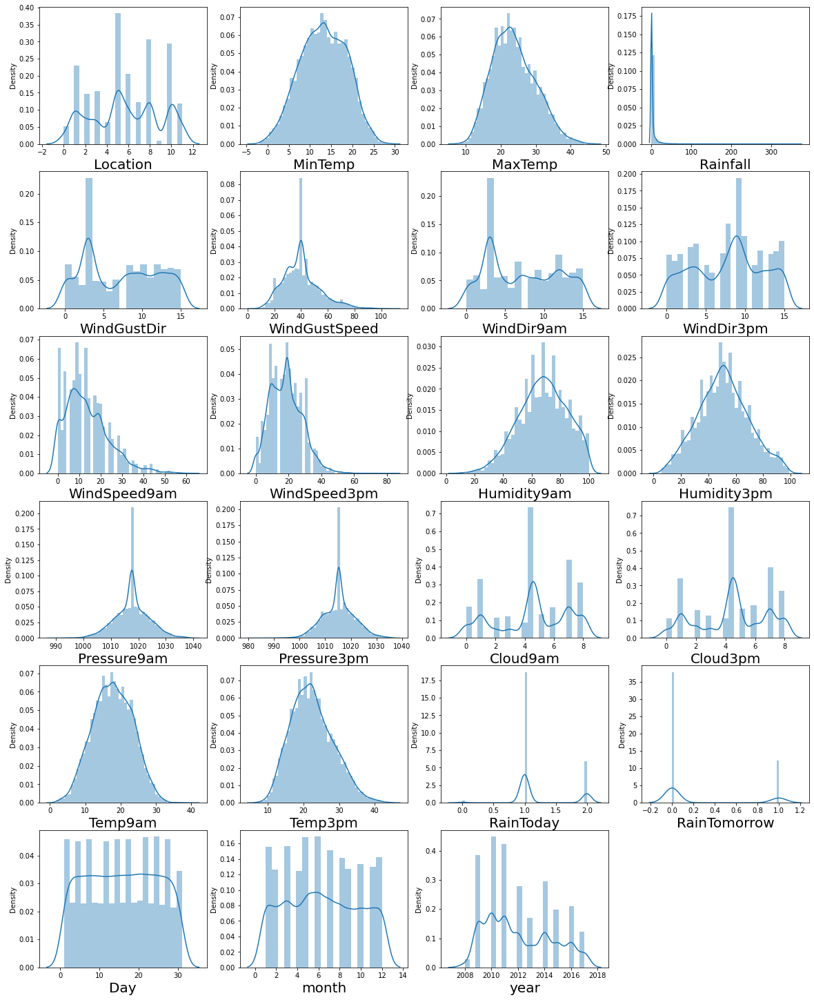

In [46]:
#let's visualize it
plt.figure(figsize=(20,30),facecolor='white')#checking data distribution wheather its normal (bell shape )
plotnumber=1
for column in df1:
    if plotnumber<=23:
        ax=plt.subplot(7,4,plotnumber)
        sns.distplot(df1[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1  
plt.show()

Rainfall,windspeed9am,windspeed3pm,pressure9am,pressure3pm have right skewness as well as possible outliers.
other's have categorical values.

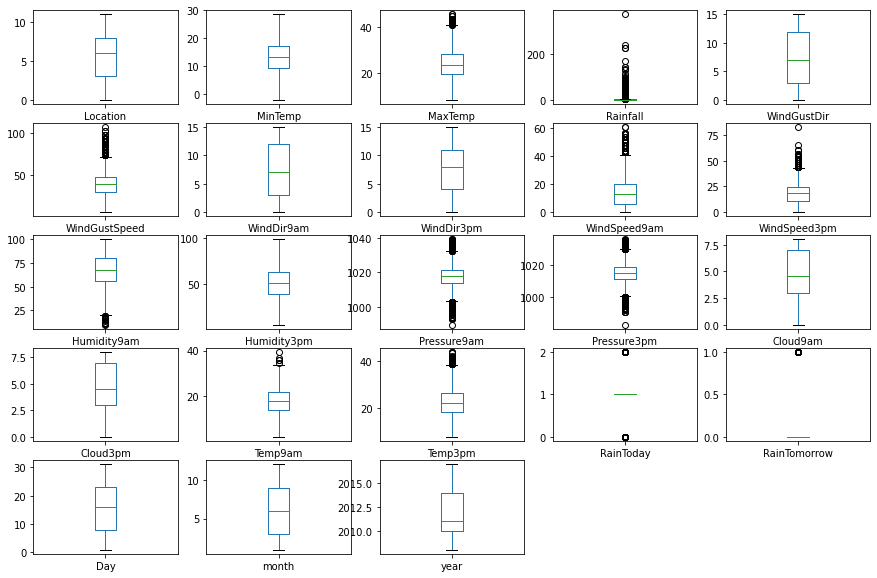

In [47]:
#visualizing outliers
df1.plot(kind='box',subplots=True,layout=(5,5),figsize=(15,10))
plt.show()

Maxtemp,rainfall,windgustspeed,windspeed9am,windspeed3pm,humidity9am,pressure9am,pressure3pm,temp9am,temp3pm have outliers.

In [48]:
from scipy.stats import zscore #taking into consideration 99.7% data
z = np.abs(zscore(df1))
df_new = df1[(z<3).all(axis = 1)]
df_new

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,month,year
0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,1,0,1,12,2008
1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,1,0,2,12,2008
2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,1,0,3,12,2008
3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,1,0,4,12,2008
4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,1,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,3.5,21.8,0.0,0,31.0,2,0,15.0,13.0,59.0,27.0,1024.7,1021.2,4.566622,4.503183,9.4,20.9,1,0,20,6,2017
8420,9,2.8,23.4,0.0,0,31.0,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,1,0,21,6,2017
8421,9,3.6,25.3,0.0,6,22.0,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,1,0,22,6,2017
8422,9,5.4,26.9,0.0,3,37.0,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,1,0,23,6,2017


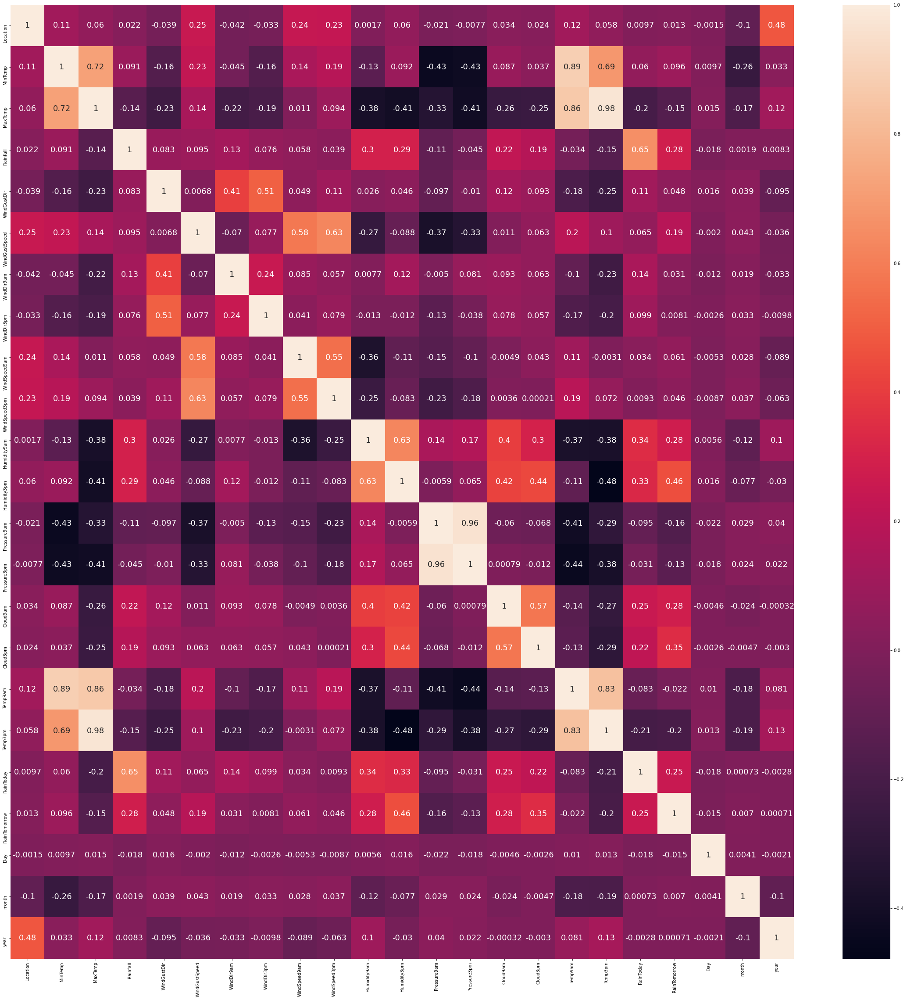

In [49]:
#checking for multicollinearity
corr=df_new.corr()
plt.figure(figsize=(40,40))
sns.heatmap(data=corr,annot=True,annot_kws={'size':18},)
plt.show()

temp9am and mintemp,maxtemp
temp3pm and maxtemp,temp9am
pressure9am and pressue3pm
are highly correlated.


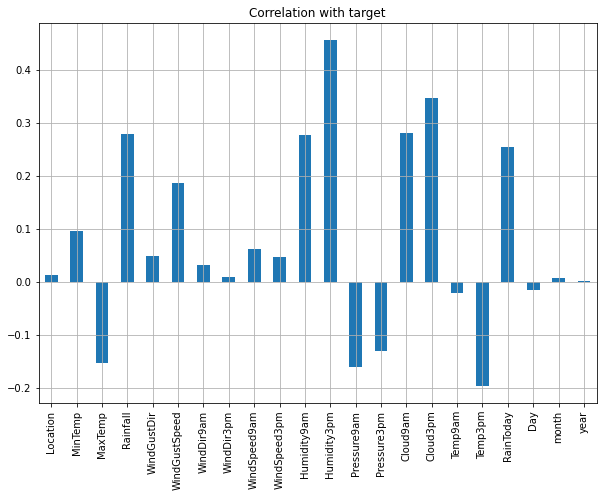

In [50]:
#checking correlation of features and target using corrwith
df_new.drop('RainTomorrow',axis=1).corrwith(df_new.RainTomorrow)
#visualising the correlation 
df_new.drop('RainTomorrow',axis=1).corrwith(df_new.RainTomorrow).plot(kind='bar',figsize=(10,7),title='Correlation with target',grid=True)
plt.show()

We will drop pressure3pm,Temp9am as they are having less impact over target column and have multicollinearity.

In [51]:
df_new.drop(columns=['Temp9am','Pressure3pm'],axis=1,inplace=True)

In [52]:
df_new.shape

(7838, 21)

### Using Selectkbestto select 12 features out of total 20 feature.

In [56]:
X=df_new.drop('RainTomorrow',axis=1)
y=df_new.RainTomorrow
from sklearn.feature_selection import SelectKBest,f_classif
#f_classif uses anova for feature selection
best_fet=SelectKBest(score_func=f_classif,k=12)
fit=best_fet.fit(X,y)
score=pd.DataFrame(fit.scores_)
columns=pd.DataFrame(X.columns)
feature_score=pd.concat([score,columns],axis=1)
feature_score.columns=['score','feature']
print(feature_score.nlargest(12,'score'))

          score        feature
11  2054.364753    Humidity3pm
14  1063.297953       Cloud3pm
13   663.621814       Cloud9am
3    657.473327       Rainfall
10   652.440096    Humidity9am
16   539.122434      RainToday
15   315.129682        Temp3pm
5    283.080571  WindGustSpeed
12   208.760943    Pressure9am
2    187.813392        MaxTemp
1     72.718518        MinTemp
8     29.049574   WindSpeed9am


In [57]:
X_new=df_new[['Humidity3pm',
               'Cloud3pm',
               'Cloud9am','Rainfall','Humidity9am','RainToday','Temp3pm','WindGustSpeed','Pressure9am','MaxTemp','MinTemp'
              ,'WindSpeed9am']]

In [58]:
X_new.skew()#consider threshold to be=-.50

Humidity3pm      0.130255
Cloud3pm        -0.257243
Cloud9am        -0.343644
Rainfall         3.478296
Humidity9am     -0.228043
RainToday        0.913078
Temp3pm          0.330484
WindGustSpeed    0.521753
Pressure9am      0.023776
MaxTemp          0.316438
MinTemp         -0.075819
WindSpeed9am     0.713664
dtype: float64

In [59]:
#Removing skewness using yeo-johnson method
from sklearn.preprocessing import power_transform
X_skew=power_transform(X_new,method='yeo-johnson')

In [60]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X_skew)

Fixing imbalanced dataset using oversampling

In [61]:
from imblearn.over_sampling import SMOTE
sme = SMOTE(random_state=42)
sme.fit(X_scaled, y)
X_resampled, Y_resampled = sme.fit_resample(X_scaled, y)

In [62]:
X_train,X_test,y_train,y_test=train_test_split(X_resampled,Y_resampled,test_size=.30,random_state=343)

### LogisticRegression

In [63]:
from sklearn.linear_model import LogisticRegression
log_reg=LogisticRegression()
log_reg.fit(X_train,y_train)
y_pred=log_reg.predict(X_test)
accuracy=accuracy_score(y_pred,y_test)
print(accuracy)
cnf=confusion_matrix(y_test,y_pred)
print(cnf,'\n')
print(classification_report(y_test,y_pred))


X_pred=log_reg.predict(X_train)
print('Training score:',log_reg.score(X_train,y_train))
print('Testing score:',log_reg.score(X_test,y_test))
from sklearn.model_selection import cross_val_score
cvs=cross_val_score(log_reg,X_resampled,Y_resampled,cv=5)
print('Cross_validation_score:',cvs.mean())

0.7731815657967795
[[1389  387]
 [ 430 1396]] 

              precision    recall  f1-score   support

           0       0.76      0.78      0.77      1776
           1       0.78      0.76      0.77      1826

    accuracy                           0.77      3602
   macro avg       0.77      0.77      0.77      3602
weighted avg       0.77      0.77      0.77      3602

Training score: 0.7712449416805522
Testing score: 0.7731815657967795
Cross_validation_score: 0.7544205192280994


### Decision_tree_classifier

In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)
dt.score(X_train,y_train)
y_pred=dt.predict(X_test)
print(accuracy_score(y_pred,y_test))

cnf=confusion_matrix(y_test,y_pred)
print(cnf,'\n')
print(classification_report(y_test,y_pred))


X_pred=dt.predict(X_train)
print('Training score:',dt.score(X_train,y_train))
print('Testing score:',dt.score(X_test,y_test))
from sklearn.model_selection import cross_val_score
cvs=cross_val_score(dt,X_resampled,Y_resampled,cv=5)
print('Cross_validation_score:',cvs.mean())

0.8742365352581899
[[1550  226]
 [ 227 1599]] 

              precision    recall  f1-score   support

           0       0.87      0.87      0.87      1776
           1       0.88      0.88      0.88      1826

    accuracy                           0.87      3602
   macro avg       0.87      0.87      0.87      3602
weighted avg       0.87      0.87      0.87      3602

Training score: 1.0
Testing score: 0.8742365352581899
Cross_validation_score: 0.8092299736221019


### Random Forest Classifier

In [65]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train,y_train)
train_pred=rf.predict(X_train)
y_pred=rf.predict(X_test)
accuracy=accuracy_score(y_pred,y_test)
print(accuracy)
cnf=confusion_matrix(y_test,y_pred)
print(cnf,'\n')
print(classification_report(y_test,y_pred))


X_pred=rf.predict(X_train)
print('Training score:',rf.score(X_train,y_train))
print('Testing score:',rf.score(X_test,y_test))
from sklearn.model_selection import cross_val_score
cvs=cross_val_score(rf,X_resampled,Y_resampled,cv=5)
print('Cross_validation_score:',cvs.mean())

0.9286507495835646
[[1633  143]
 [ 114 1712]] 

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      1776
           1       0.92      0.94      0.93      1826

    accuracy                           0.93      3602
   macro avg       0.93      0.93      0.93      3602
weighted avg       0.93      0.93      0.93      3602

Training score: 1.0
Testing score: 0.9286507495835646
Cross_validation_score: 0.8626323753991392


### XGBoost classsifier

In [66]:
import xgboost as xgb
xgb=xgb.XGBClassifier()

xgb.fit(X_train,y_train)
y_pred=xgb.predict(X_test)
accuracy=accuracy_score(y_test,y_pred)


print(accuracy)
cnf=confusion_matrix(y_test,y_pred)
print(cnf,'\n')
print(classification_report(y_test,y_pred))


X_pred=xgb.predict(X_train)
print('Training score:',xgb.score(X_train,y_train))
print('Testing score:',xgb.score(X_test,y_test))
from sklearn.model_selection import cross_val_score
cvs=cross_val_score(xgb,X_resampled,Y_resampled,cv=5)
print('Cross_validation_score:',cvs.mean())

[21:57:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9189339255968906
[[1648  128]
 [ 164 1662]] 

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1776
           1       0.93      0.91      0.92      1826

    accuracy                           0.92      3602
   macro avg       0.92      0.92      0.92      3602
weighted avg       0.92      0.92      0.92      3602

Training score: 0.9876219947631516
Testing score: 0.9189339255968906
[21:57:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explic

### Roc_AUC_Curve

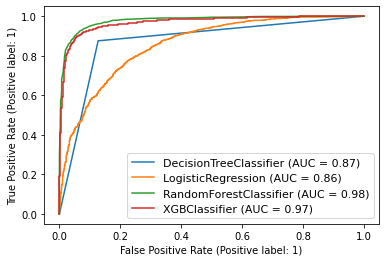

In [69]:
#Let's find best model using Reciever's operating curve by calculating area_under_the_curve
disp=plot_roc_curve(dt,X_test,y_test)
plot_roc_curve(log_reg,X_test,y_test,ax=disp.ax_) #ax_=Axes with confusion matrix of decision tree
plot_roc_curve(rf,X_test,y_test,ax=disp.ax_)
plot_roc_curve(xgb,X_test,y_test,ax=disp.ax_)
plt.legend(prop={'size':11},loc='lower right')
plt.show()

Random forest classifier is best model with highest testing score.,let's tune parameters.

In [71]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [74]:
#let's tune parameter with grid search cv
rf=RandomForestClassifier()
params={'n_estimators':[50,100,150,200,250,300],
       'criterion':['entropy','gini'],
        'min_samples_leaf':[1,2,3,5],
        'min_samples_split':[2,5,10],
       'max_depth':[10,15,20,25],
       }
from sklearn.model_selection import GridSearchCV
grd=GridSearchCV(rf,param_grid=params,n_jobs=-1)
grd.fit(X_train,y_train)
clf=grd.best_estimator_   #reinstantiating with best params

In [75]:
clf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 25,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [76]:
rf=RandomForestClassifier(criterion='entropy', max_depth=25, min_samples_leaf=1,
                       n_estimators=200)
rf.fit(X_train,y_train)
y_pred=clf.predict(X_test)
cnf=confusion_matrix(y_test,y_pred)
print(cnf)
print(accuracy_score(y_test,y_pred))

[[1643  133]
 [ 121 1705]]
0.9294836202109938


We have increased accuracy by.08 percentage.

In [ ]:
#saving the model in local system
import pickle
filename='finalized_rain_fall.pickle'
pickle.dump(rf,open(filename,'wb'))